<a href="https://colab.research.google.com/github/MosesR007/Cognifyz-ML-Internship/blob/main/Task_4_Location_Based_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
uploaded = files.upload()


Saving Dataset .csv to Dataset  (1).csv


In [ ]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import folium
from folium.plugins import MarkerCluster


In [ ]:
df = pd.read_csv(list(uploaded.keys())[0])

print("Dataset Shape:", df.shape)
df.head()


Dataset Shape: (9551, 21)


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


In [ ]:
df["Latitude"].fillna(df["Latitude"].median(), inplace=True)
df["Longitude"].fillna(df["Longitude"].median(), inplace=True)

df["City"].fillna("Unknown", inplace=True)
df["Aggregate rating"].fillna(df["Aggregate rating"].median(), inplace=True)
df["Price range"].fillna(df["Price range"].median(), inplace=True)
df["Cuisines"].fillna("Unknown", inplace=True)


/tmp/ipython-input-1787129172.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df["Latitude"].fillna(df["Latitude"].median(), inplace=True)
/tmp/ipython-input-1787129172.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=Tr

In [ ]:
restaurant_map = folium.Map(location=[20.59, 78.96], zoom_start=5)

marker_cluster = MarkerCluster().add_to(restaurant_map)

for _, row in df.iterrows():
    folium.Marker(
        location=[row["Latitude"], row["Longitude"]],
        popup=f"""
        <b>City:</b> {row['City']}<br>
        <b>Rating:</b> {row['Aggregate rating']}<br>
        <b>Price Range:</b> {row['Price range']}
        """
    ).add_to(marker_cluster)

restaurant_map


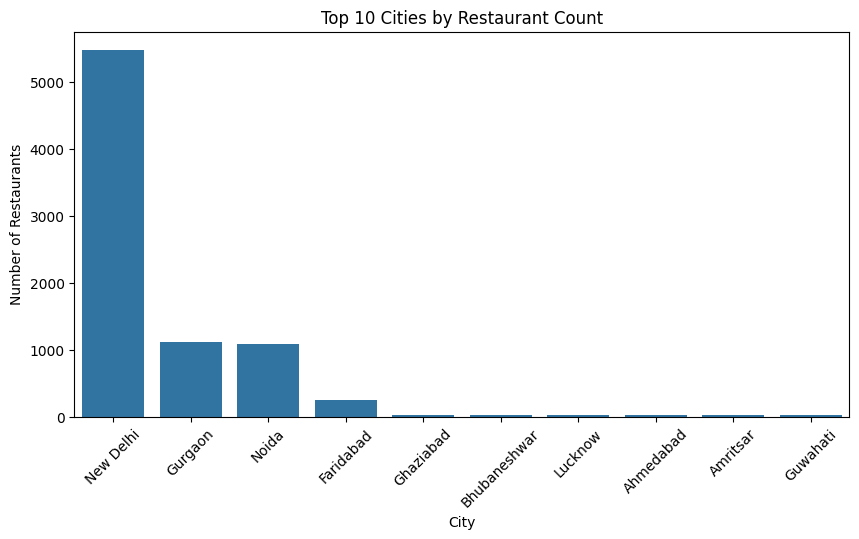

In [ ]:
city_counts = df["City"].value_counts().head(10)

plt.figure(figsize=(10,5))
sns.barplot(x=city_counts.index, y=city_counts.values)
plt.title("Top 10 Cities by Restaurant Count")
plt.xlabel("City")
plt.ylabel("Number of Restaurants")
plt.xticks(rotation=45)
plt.show()


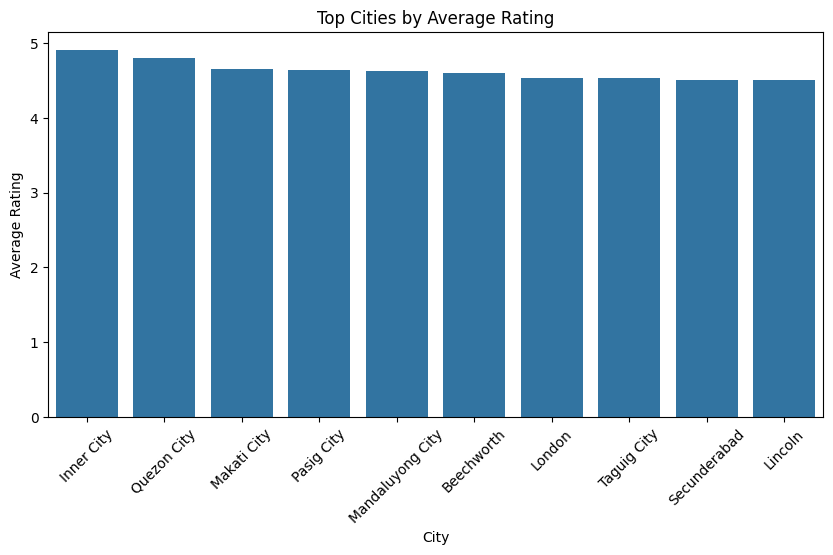

In [ ]:
avg_rating_city = df.groupby("City")["Aggregate rating"].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(10,5))
sns.barplot(x=avg_rating_city.index, y=avg_rating_city.values)
plt.title("Top Cities by Average Rating")
plt.xlabel("City")
plt.ylabel("Average Rating")
plt.xticks(rotation=45)
plt.show()


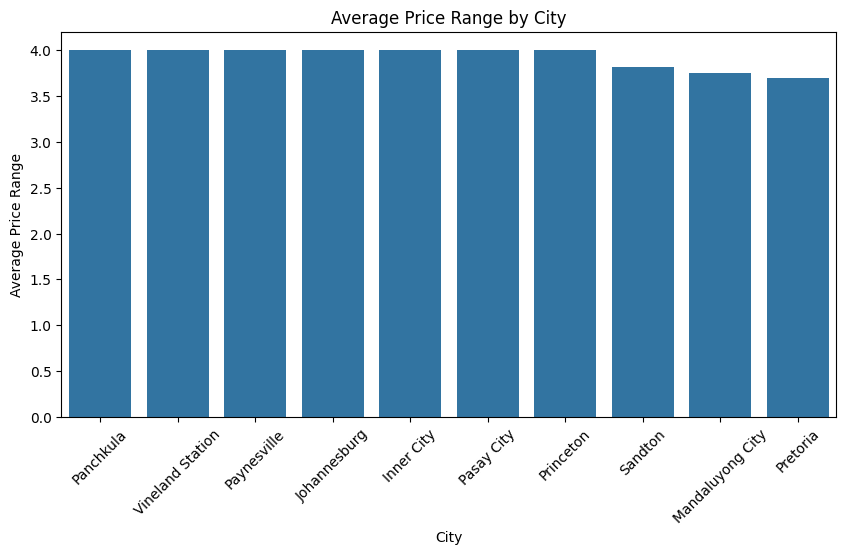

In [ ]:
avg_price_city = df.groupby("City")["Price range"].mean().sort_values(ascending=False).head(10)

plt.figure(figsize=(10,5))
sns.barplot(x=avg_price_city.index, y=avg_price_city.values)
plt.title("Average Price Range by City")
plt.xlabel("City")
plt.ylabel("Average Price Range")
plt.xticks(rotation=45)
plt.show()


In [ ]:
df["Primary_Cuisine"] = df["Cuisines"].str.split(",").str[0]

top_cuisine_city = (
    df.groupby("City")["Primary_Cuisine"]
    .agg(lambda x: x.value_counts().index[0])
    .head(10)
)

top_cuisine_city


,Primary_Cuisine
City,
Abu Dhabi,Indian
Agra,North Indian
Ahmedabad,North Indian
Albany,American
Allahabad,North Indian
Amritsar,North Indian
Ankara,Kebab
Armidale,Bar Food
Athens,American


In [ ]:
print("📍 Key Location-based Insights:")
print("1. Metro cities show the highest restaurant concentration.")
print("2. Ratings are relatively consistent across major cities.")
print("3. Higher price ranges are common in metro locations.")
print("4. Certain cuisines dominate specific cities.")
print("5. Restaurant distribution is geographically uneven.")


📍 Key Location-based Insights:
1. Metro cities show the highest restaurant concentration.
2. Ratings are relatively consistent across major cities.
3. Higher price ranges are common in metro locations.
4. Certain cuisines dominate specific cities.
5. Restaurant distribution is geographically uneven.


In [ ]:
df["City"].value_counts().head(5)


,count
City,
New Delhi,5473
Gurgaon,1118
Noida,1080
Faridabad,251
Ghaziabad,25


In [ ]:
city_name = df["City"].value_counts().index[0]

city_data = df[df["City"] == city_name]

print("City:", city_name)
print("Restaurant count:", city_data.shape[0])


City: New Delhi
Restaurant count: 5473


In [ ]:
print("Average rating in", city_name, ":")
print(city_data["Aggregate rating"].mean())


Average rating in New Delhi :
2.4388452402704184


In [ ]:
print("Average price range in", city_name, ":")
print(city_data["Price range"].mean())


Average price range in New Delhi :
1.6215969303855289


In [ ]:
city_data["Primary_Cuisine"] = city_data["Cuisines"].str.split(",").str[0]

print("Most common cuisine in", city_name, ":")
print(city_data["Primary_Cuisine"].value_counts().head(1))


Most common cuisine in New Delhi :
Primary_Cuisine
North Indian    1848
Name: count, dtype: int64


/tmp/ipython-input-3246350859.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  city_data["Primary_Cuisine"] = city_data["Cuisines"].str.split(",").str[0]


In [ ]:
df[["City", "Latitude", "Longitude"]].head()


,City,Latitude,Longitude
0,Makati City,14.565443,121.027535
1,Makati City,14.553708,121.014101
2,Mandaluyong City,14.581404,121.056831
3,Mandaluyong City,14.585318,121.056475
4,Mandaluyong City,14.584450,121.057508
